<a href="https://colab.research.google.com/github/Rajaguhan437/Cell_Detect-Quantitative-Representation/blob/main/Cell_detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [22]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:

import shutil # for file operations
import zipfile, os, sys, random
from glob import glob
import pandas as pd # for data manipulation
import numpy as np # for dealing with arrays
from sklearn import preprocessing # for preprocessing purpose
import cv2 # for displaying the image
from matplotlib import patches # data visualization
import matplotlib.pyplot as plt # data visualization
%matplotlib inline


In [4]:
os.mkdir('/content/drive/MyDrive/Ninti/')
!wget https://www.dropbox.com/sh/v6epaau1kh7ofyj/AADOJsX-ghd70tn_ds1aDJtMa?dl=0 -O "/content/drive/MyDrive/Ninti/dataset.zip"

--2023-06-18 02:13:20--  https://www.dropbox.com/sh/v6epaau1kh7ofyj/AADOJsX-ghd70tn_ds1aDJtMa?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6027:18::a27d:4812
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /sh/raw/v6epaau1kh7ofyj/AADOJsX-ghd70tn_ds1aDJtMa [following]
--2023-06-18 02:13:21--  https://www.dropbox.com/sh/raw/v6epaau1kh7ofyj/AADOJsX-ghd70tn_ds1aDJtMa
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc569a507d2f26b23c28e22a52e9.dl.dropboxusercontent.com/zip_download_get/BhnppFojT0KVXtMiMjHpJus50AcA_pnrJreELGjNaXqn0aXrfqfurqLY51CaTfULeb4tXT8uJsL-MFx6oW9Xqyt1d5VfB9yp9v_3LbXZ7KUQtA# [following]
--2023-06-18 02:13:22--  https://uc569a507d2f26b23c28e22a52e9.dl.dropboxusercontent.com/zip_download_get/BhnppFojT0KVXtMiMjHpJus50AcA_pnrJreELGjNaXqn0aXrfqfurqLY51CaTfULeb4tXT8uJsL-MFx6oW9Xqyt1d

In [5]:
local_zip = '/content/drive/MyDrive/Ninti/dataset.zip'
with zipfile.ZipFile(local_zip, 'r') as zip_ref:
    zip_ref.extractall("/content/drive/MyDrive/Ninti/unzipped_dataset")

In [7]:
# load the annotations data
df = pd.read_csv("/content/drive/MyDrive/Ninti/unzipped_dataset/annotations.csv")
df

,image,xmin,ymin,xmax,ymax,label
0,image-100.png,0.000000,0.000000,25.190198,40.816803,rbc
1,image-100.png,15.010502,0.000000,68.337223,23.527421,rbc
2,image-100.png,25.017503,16.021004,78.374562,73.735123,rbc
3,image-100.png,75.565928,1.061844,140.248541,45.591599,rbc
4,image-100.png,77.483081,23.290548,131.936989,74.806301,rbc
...,...,...,...,...,...,...
2335,image-69.png,227.765502,207.710259,256.000000,248.054115,rbc
2336,image-69.png,201.832018,211.930101,251.736189,256.000000,rbc
2337,image-69.png,81.188275,231.883878,130.855693,254.391206,rbc
2338,image-69.png,35.903044,244.555806,79.863585,255.066516,rbc


In [8]:
# defining some functions for creating the necessary columns
img_width = 256
img_height = 256

def width(df):
  return (df.xmax - df.xmin)
def height(df):
  return (df.ymax - df.ymin)
def x_center(df):
  return (df.xmin + (df.width/2))
def y_center(df):
  return (df.ymin + (df.height/2))
def w_norm(df):
  return df/img_width
def h_norm(df):
  return df/img_height

In [9]:
le = preprocessing.LabelEncoder()
le.fit(df['label'])
print(le.classes_)

['rbc' 'wbc']


In [10]:
# applying the created functions
labels = le.transform(df['label'])
df['label'] = labels

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

df['x_center_norm'] = df['x_center'].apply(w_norm)
df['width_norm'] = df['width'].apply(w_norm)

df['y_center_norm'] = df['y_center'].apply(h_norm)
df['height_norm'] = df['height'].apply(h_norm)

In [11]:
df

,image,xmin,ymin,xmax,ymax,label,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,image-100.png,0.000000,0.000000,25.190198,40.816803,0,25.190198,40.816803,12.595099,20.408401,0.049200,0.098399,0.079720,0.159441
1,image-100.png,15.010502,0.000000,68.337223,23.527421,0,53.326721,23.527421,41.673862,11.763711,0.162789,0.208308,0.045952,0.091904
2,image-100.png,25.017503,16.021004,78.374562,73.735123,0,53.357060,57.714119,51.696033,44.878063,0.201938,0.208426,0.175305,0.225446
3,image-100.png,75.565928,1.061844,140.248541,45.591599,0,64.682614,44.529755,107.907235,23.326721,0.421513,0.252666,0.091120,0.173944
4,image-100.png,77.483081,23.290548,131.936989,74.806301,0,54.453909,51.515753,104.710035,49.048425,0.409024,0.212711,0.191595,0.201233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2335,image-69.png,227.765502,207.710259,256.000000,248.054115,0,28.234498,40.343856,241.882751,227.882187,0.944854,0.110291,0.890165,0.157593
2336,image-69.png,201.832018,211.930101,251.736189,256.000000,0,49.904171,44.069899,226.784104,233.965051,0.885875,0.194938,0.913926,0.172148
2337,image-69.png,81.188275,231.883878,130.855693,254.391206,0,49.667418,22.507328,106.021984,243.137542,0.414148,0.194013,0.949756,0.087919
2338,image-69.png,35.903044,244.555806,79.863585,255.066516,0,43.960541,10.510710,57.883315,249.811161,0.226107,0.171721,0.975825,0.041057


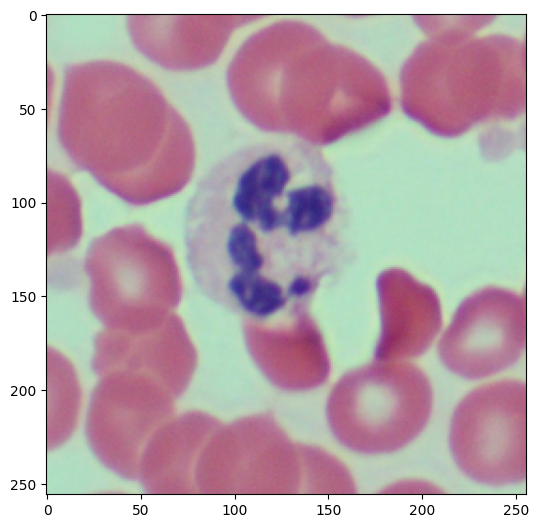

In [12]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
image = plt.imread('/content/drive/MyDrive/Ninti/unzipped_dataset/images/image-23.png')
plt.imshow(image)

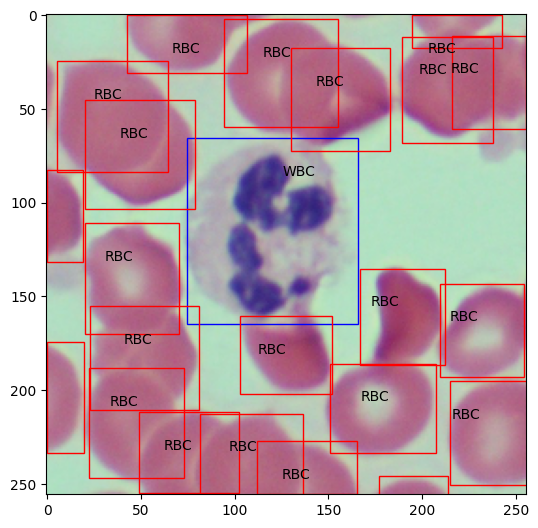

In [14]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
image = plt.imread('/content/drive/MyDrive/Ninti/unzipped_dataset/images/image-23.png')

# iterating over the image for different objects
for _,row in df[df.image == "image-23.png"].iterrows():
    xmin = row.xmin
    xmax = row.xmax
    ymin = row.ymin
    ymax = row.ymax

    width = xmax - xmin
    height = ymax - ymin

    # assign different color to different classes of objects
    if row.label == 0:
        edgecolor = 'r'
        ax.annotate('RBC', xy=(xmax-40,ymin+20))
    elif row.label == 1:
        edgecolor = 'b'
        ax.annotate('WBC', xy=(xmax-40,ymin+20))

    # add bounding boxes to the image
    rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none')

    ax.add_patch(rect)
plt.imshow(image)

In [15]:
# data splitting
df_train = df[0:2099]
df_val = df[2099:]
print(df_train.shape, df_val.shape)

(2099, 14) (241, 14)


In [14]:
# creating some folders for data segregation purpose

path = "/content/drive/MyDrive/Ninti/unzipped_dataset/"

os.mkdir(path+'cells/')

os.mkdir(path+'cells/images/')
os.mkdir(path+'cells/images/train/')
os.mkdir(path+'cells/images/val/')

os.mkdir(path+'cells/labels/')
os.mkdir(path+'cells/labels/train/')
os.mkdir(path+'cells/labels/val/')

In [16]:
%%time

# creating a function for data segregation
def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.image:
    filenames.append(filename)
  filenames = set(filenames)

  for filename in filenames:
    yolo_list = []

    for _,row in df[df.image == filename].iterrows():
      yolo_list.append([row.label, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
    txt_filename = os.path.join(train_label_path,str(row.image.split('.')[0])+".txt")
    # Save the .img & .txt files to the corresponding train and validation folders
    np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    shutil.copyfile(os.path.join(img_path,row.image), os.path.join(train_img_path,row.image)) # file copy(source, dest)

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 7.39 µs


In [17]:
%%time

path = "/content/drive/MyDrive/Ninti/unzipped_dataset/"

src_img_path = path+"/images/"
src_label_path = path+"/annotations.csv"

train_img_path = path+'cells/images/train/'
train_label_path = path+'cells/labels/train/'

val_img_path = path+'cells/images/val/'
val_label_path = path+'cells/labels/val/'

segregate_data(df_train, src_img_path, src_label_path, train_img_path, train_label_path)
segregate_data(df_val, src_img_path, src_label_path, val_img_path, val_label_path)

CPU times: user 701 ms, sys: 122 ms, total: 823 ms
Wall time: 1min 36s


In [18]:
print("Number of Training images", len(os.listdir(train_img_path)))
print("Number of Training labels", len(os.listdir(train_label_path)))

print("Number of valid images", len(os.listdir(val_img_path)))
print("Number of valid labels", len(os.listdir(val_label_path)))

Number of Training images 90
Number of Training labels 90
Number of valid images 10
Number of valid labels 10


In [19]:
!rm -rf /content/yolov5

In [19]:
## Yolo v5 model

%cd /content/drive/MyDrive/Ninti/
!git clone 'https://github.com/ultralytics/yolov5.git'

/content/drive/MyDrive/Ninti
fatal: destination path 'yolov5' already exists and is not an empty directory.


In [20]:
%cd /content/
!pip install -r '/content/drive/MyDrive/Ninti/yolov5/requirements.txt'

/content
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.2/611.2 kB 32.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.0 MB/s eta 0:00:00


In [21]:
# creaing .yaml file for specifying about the paths, number of classes, and class names
!echo -e "train: '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/'\nval: '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/'\n\nnc: 2\nnames: ['rbc', 'wbc']" >> rbcdet.yaml
!cat 'rbcdet.yaml'

train: '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/'
val: '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/'

nc: 2
names: ['rbc', 'wbc']


In [22]:
# copying the created .yaml file to the yolov5 folder
shutil.copyfile('/content/rbcdet.yaml', '/content/drive/MyDrive/Ninti/yolov5/rbcdet.yaml')

'/content/drive/MyDrive/Ninti/yolov5/rbcdet.yaml'

In [23]:
# overwriting the number of class on yolov5s.yaml file
!sed -i 's/nc: 80/nc: 2/g' /content/drive/MyDrive/Ninti/yolov5/models/yolov5s.yaml

In [24]:
!cat '/content/drive/MyDrive/Ninti/yolov5/models/yolov5s.yaml'

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 2  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [25]:
!python /content/drive/MyDrive/Ninti/yolov5/detect.py --source /content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/ --img-size 256 --conf-thres 0.001 --exist-ok --name detect_output --weights /content/drive/MyDrive/Ninti/yolov5/yolov5s.pt --data /content/drive/MyDrive/Ninti/yolov5/rbcdet.yaml

detect: weights=['/content/drive/MyDrive/Ninti/yolov5/yolov5s.pt'], source=/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/, data=/content/drive/MyDrive/Ninti/yolov5/rbcdet.yaml, imgsz=[256, 256], conf_thres=0.001, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=drive/MyDrive/Ninti/yolov5/runs/detect, name=detect_output, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-183-g878d9c8 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/90 /content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/image-1.png: 256x256 9 apples, 1 donut, 1 cake, 5 teddy bears, 5.4ms
image 2/90 /content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/image-1

In [26]:
# Comet: run 'pip install comet_ml' to automatically track and visualize YOLOv5 🚀 runs in Comet

# TensorBoard: Start with 'tensorboard --logdir yolov5/runs/train', view at http://localhost:6006/

In [29]:
# training the custom data

%%time
!python /content/drive/MyDrive/Ninti/yolov5/train.py --img 256 --batch 64 --epochs 300 --data=rbcdet.yaml --cfg=/content/drive/MyDrive/Ninti/yolov5/models/yolov5s.yaml --name rbcwbc_model --cache-ram --line-thickness 1

python3: can't open file '/content/yolov5/train.py': [Errno 2] No such file or directory
CPU times: user 3.47 ms, sys: 1.84 ms, total: 5.31 ms
Wall time: 105 ms


In [27]:
#!cp -r "/content/yolov5" "/content/drive/MyDrive/Ninti"

In [28]:
!python /content/drive/MyDrive/Ninti/yolov5/detect.py --source /content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/image-106.png --imgsz 256 --weights '/content/drive/MyDrive/Ninti/yolov5/runs/train/rbcd/weights/best.pt' --visualize

detect: weights=['/content/drive/MyDrive/Ninti/yolov5/runs/train/rbcd/weights/best.pt'], source=/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/image-106.png, data=drive/MyDrive/Ninti/yolov5/data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=True, update=False, project=drive/MyDrive/Ninti/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-183-g878d9c8 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Saving drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage0_Conv_features.png... (32/32)
Saving drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage1_Conv_features.png... (32/64)
S

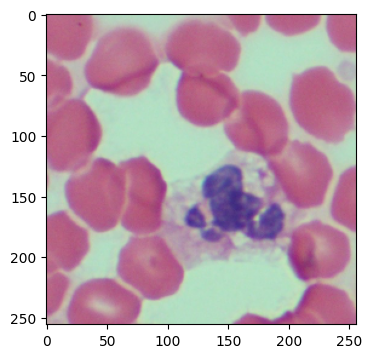

In [29]:
inp_img = "/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/train/image-106.png"
fig=plt.figure(figsize=(4, 5))
img = plt.imread(inp_img)
plt.imshow(img)
plt.show()

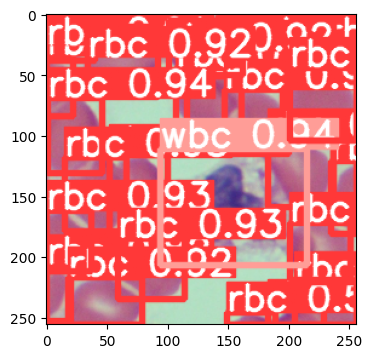

In [40]:
fig=plt.figure(figsize=(4, 5))
fin_img_path = '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106.png'
fin_img = plt.imread(fin_img_path)
plt.imshow(fin_img)
plt.show()

In [66]:

import glob

# Get the list of filenames in the folder
folder_path = '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106'
img_path = glob.glob(folder_path + '/*.png')
print(img_path)

img_name = []
for i in img_path:
  x = i[len(folder_path)+1:]
  img_name.append(x)
print(img_name)


['/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage0_Conv_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage1_Conv_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage2_C3_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage3_Conv_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage4_C3_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage5_Conv_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage6_C3_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage7_Conv_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage8_C3_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage9_SPPF_features.png', '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106/stage10_Conv_features.png', '/con

In [65]:
# Another Method

import os

# Get the list of filenames in the folder
folder_path = '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp2/image-106'
img_name = os.listdir(folder_path)

# Filter the list to include only image files
img_name = [file for file in img_name if file.endswith('.jpg') or file.endswith('.jpeg') or file.endswith('.png')]

# Print the list of image filenames
print(img_name)

['stage0_Conv_features.png', 'stage1_Conv_features.png', 'stage2_C3_features.png', 'stage3_Conv_features.png', 'stage4_C3_features.png', 'stage5_Conv_features.png', 'stage6_C3_features.png', 'stage7_Conv_features.png', 'stage8_C3_features.png', 'stage9_SPPF_features.png', 'stage10_Conv_features.png', 'stage11_Upsample_features.png', 'stage12_Concat_features.png', 'stage13_C3_features.png', 'stage14_Conv_features.png', 'stage15_Upsample_features.png', 'stage16_Concat_features.png', 'stage17_C3_features.png', 'stage18_Conv_features.png', 'stage19_Concat_features.png', 'stage20_C3_features.png', 'stage21_Conv_features.png', 'stage22_Concat_features.png', 'stage23_C3_features.png']


In [34]:
### download the font and send upload to gdrive
### good fonts can be easily downloaded from google fonts

%cd /content/drive/MyDrive/
!cp "/content/drive/MyDrive/Colab Notebooks/Bruno_Ace_SC.zip (Unzipped Files)/BrunoAceSC-Regular.ttf" /usr/share/fonts/truetype/
!fc-cache -f -v

/content/drive/MyDrive
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 1 fonts, 2 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped directory detected
/usr/share/fonts/truetype/humor-sans: skipping, looped directory detected
/usr/share/fonts/truetype/liberation: skipping, looped directory detected
/var/cache/fontconfig: cleaning cache directory
/root/.cache/fontconfig: not cleaning non-existent cache directory
/root/.fontconfig: not cleaning non-existent cache directory
fc-cache: succeeded


In [68]:
from PIL import Image, ImageDraw, ImageFont
import torchvision.transforms as transforms
from PIL import Image

import torch
import torchvision.transforms as transforms

def create_image_grid(input_image, output_image_path, final_image, image_names, rows, columns):

    pil_images = []
    # Open the image in PIL format
    for i in output_image_path:
      image = Image.open(i)
      pil_images.append(image)

    input_image = Image.open(input_image)
    input_image = input_image.resize((pil_images[1].size[0], pil_images[1].size[1]), Image.LANCZOS)

    final_image = Image.open(final_image)
    final_image = final_image.resize((pil_images[1].size[0], pil_images[1].size[1]), Image.LANCZOS)

    # Add the main image to the list of images
    pil_images = [input_image] + pil_images + [final_image]
    image_names = ['Original Image'] + image_names + ['Final Result Image']

    # Calculate the size of the grid image
    img_width, img_height = pil_images[1].size
    grid_width = img_width * columns + (columns - 1) * 20
    grid_height = img_height * rows + (rows - 1) * 10 * 4+ 30 * rows * 4

    # Create a blank grid image
    grid_image = Image.new('RGB', (grid_width, grid_height), color='grey')
    draw = ImageDraw.Draw(grid_image)

    # font customize
    font = ImageFont.truetype('BrunoAceSC-Regular.ttf', size=100)

    # Add images and names to the grid
    for i in range(rows):
        for j in range(columns):
            index = i * columns + j
            if index < len(pil_images):
                img = pil_images[index]
                x_offset = j * (img_width + 10)
                y_offset = i * (img_height + 40*3)
                grid_image.paste(img, (x_offset, y_offset))
                text_width, text_height = draw.textsize(image_names[index], font)
                text_x = x_offset + (img.size[0] - text_width) // 2
                text_y = y_offset + img.size[1]
                draw.text((text_x, text_y), image_names[index], font=font, fill='black')

    grid_image.save('/content/drive/MyDrive/Ninti/yolo_layers.png')
    return grid_image

In [69]:
create_image_grid(inp_img, img_path, fin_img_path, img_name, 9, 3)

In [70]:
!python /content/drive/MyDrive/Ninti/yolov5/detect.py --source /content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/ --imgsz 256 --weights '/content/drive/MyDrive/Ninti/yolov5/runs/train/rbcd/weights/best.pt'

detect: weights=['/content/drive/MyDrive/Ninti/yolov5/runs/train/rbcd/weights/best.pt'], source=/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/, data=Ninti/yolov5/data/coco128.yaml, imgsz=[256, 256], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=Ninti/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-183-g878d9c8 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/10 /content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-22.png: 256x256 24 rbcs, 1 wbc, 5.5ms
image 2/10 /content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-23.png: 256x256 23 rbcs, 1 wbc, 5.2ms
i

In [31]:
from PIL import Image, ImageDraw, ImageFont
import torchvision.transforms as transforms
from PIL import Image


def create_image_grid(input_image_path, output_image_path, img_names, rows=10, columns=2):

    pil_images = []
    # Open the image in PIL format

    for i in img_names:
      for j in input_image_path:
        if i in j:
          image = Image.open(j)
          pil_images.append(image)
      for k in output_image_path:
        if i in k:
          image = Image.open(k)
          pil_images.append(image)

    # Add the main image to the list of images
    pil_images = pil_images
    image_names = []
    [image_names.extend([i, i]) for i in img_names]

    # Calculate the size of the grid image
    img_width, img_height = pil_images[1].size
    grid_width = img_width * columns + (columns - 1) * 20
    grid_height = img_height * rows + (rows - 1) * 10 + 30 * rows

    # Create a blank grid image
    grid_image = Image.new('RGB', (grid_width, grid_height), color='grey')
    draw = ImageDraw.Draw(grid_image)

    # font customize
    font = ImageFont.truetype('BrunoAceSC-Regular.ttf', size=24)

    # Add images and names to the grid
    for i in range(rows):
        for j in range(columns):
            index = i * columns + j
            if index < len(pil_images):
                img = pil_images[index]
                x_offset = j * (img_width + 10)
                y_offset = i * (img_height + 40)
                grid_image.paste(img, (x_offset, y_offset))
                text_width, text_height = draw.textsize(image_names[index], font)
                text_x = x_offset + (img.size[0] - text_width) // 2
                text_y = y_offset + img.size[1]
                draw.text((text_x, text_y), image_names[index], font=font, fill='black')

    grid_image.save('/content/drive/MyDrive/Ninti/yolo_val_dect.png')
    return grid_image

In [27]:
import glob

# Get the list of filenames in the folder
input_folder_path = '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/'
input_img_path = glob.glob(input_folder_path + '/*.png')
print(input_img_path)

img_name = []
for i in input_img_path:
  x = i[len(input_folder_path):]
  img_name.append(x)
print(img_name)

output_folder_path = '/content/drive/MyDrive/Ninti/yolov5/runs/detect/exp3/'
output_img_path = glob.glob(output_folder_path + '/*.png')
print(output_img_path)

['/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-7.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-31.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-91.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-22.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-33.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-25.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-24.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-69.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-35.png', '/content/drive/MyDrive/Ninti/unzipped_dataset/cells/images/val/image-23.png']
['image-7.png', 'image-31.png', 'image-91.png', 'image-22.png', 'image-33.png', 'image-25.png', 'image-24.png', 'image-69.png', 'image-35.png', 'image-23.png']
['/content/drive/MyDrive/Ninti/yolov5/runs/detect/

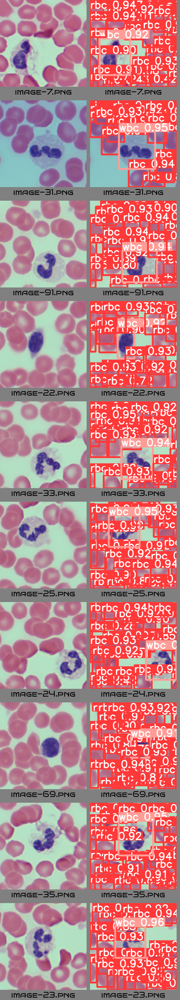

In [35]:
create_image_grid(input_img_path, output_img_path, img_name)